In [2]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd

In [17]:
df = pd.read_csv("gait.csv")

In [4]:
df.head()

,ac_x,ac_y,ac_z,gy_x,gy_y,gy_z,Label
0,-1.604164,0.895459,10.565935,0.224960,0.250687,1.259995,Normal
1,-1.673598,3.076643,6.605804,0.312317,0.170792,0.899933,Normal
2,-0.126897,2.691165,7.405492,0.415649,0.101562,0.521759,Normal
3,0.354353,2.597788,9.371192,0.453995,0.069595,0.159576,Normal
4,0.416604,2.226676,10.247497,0.382614,0.060013,-0.156815,Normal


In [5]:
X = df.drop('Label', axis =1)
X

,ac_x,ac_y,ac_z,gy_x,gy_y,gy_z
0,-1.604164,0.895459,10.565935,0.224960,0.250687,1.259995
1,-1.673598,3.076643,6.605804,0.312317,0.170792,0.899933
2,-0.126897,2.691165,7.405492,0.415649,0.101562,0.521759
3,0.354353,2.597788,9.371192,0.453995,0.069595,0.159576
4,0.416604,2.226676,10.247497,0.382614,0.060013,-0.156815
...,...,...,...,...,...,...
70995,-2.367866,1.103727,0.905008,-1.657430,0.304669,-1.493336
70996,-1.441309,1.345541,-0.189142,-1.164462,0.098197,-1.537930
70997,-1.211466,1.738190,-0.526724,-0.898735,-0.154702,-1.441413
70998,-0.509965,2.346318,-0.648829,-1.153466,-0.245721,-1.195234


In [18]:
df['Label']

0          Normal
1          Normal
2          Normal
3          Normal
4          Normal
           ...   
70995    Abnormal
70996    Abnormal
70997    Abnormal
70998    Abnormal
70999    Abnormal
Name: Label, Length: 71000, dtype: object

In [19]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df['Label'] = label_encoder.fit_transform(df['Label'])

print(df)
# normal =1 , abnormal = 0

           ac_x      ac_y       ac_z      gy_x      gy_y      gy_z  Label
0     -1.604164  0.895459  10.565935  0.224960  0.250687  1.259995      1
1     -1.673598  3.076643   6.605804  0.312317  0.170792  0.899933      1
2     -0.126897  2.691165   7.405492  0.415649  0.101562  0.521759      1
3      0.354353  2.597788   9.371192  0.453995  0.069595  0.159576      1
4      0.416604  2.226676  10.247497  0.382614  0.060013 -0.156815      1
...         ...       ...        ...       ...       ...       ...    ...
70995 -2.367866  1.103727   0.905008 -1.657430  0.304669 -1.493336      0
70996 -1.441309  1.345541  -0.189142 -1.164462  0.098197 -1.537930      0
70997 -1.211466  1.738190  -0.526724 -0.898735 -0.154702 -1.441413      0
70998 -0.509965  2.346318  -0.648829 -1.153466 -0.245721 -1.195234      0
70999 -0.004788  2.516306  -0.646434 -1.473560 -0.449139 -1.005866      0

[71000 rows x 7 columns]


In [20]:
y = df['Label']

In [21]:
y

0        1
1        1
2        1
3        1
4        1
        ..
70995    0
70996    0
70997    0
70998    0
70999    0
Name: Label, Length: 71000, dtype: int32

In [10]:
#generating the sample data from make_blobs
#
X,y= make_blobs(n_samples = 500,
               n_features = 2,
                centers = 4,
                cluster_std = 1,
                center_box = (-10.0,10.0),
                shuffle = True,
                random_state = 1)  # for reproducibility
#range_n_clusters = [2,3,4,5,6]

In [22]:
y.shape

(71000,)

In [23]:
X.shape

(71000, 6)

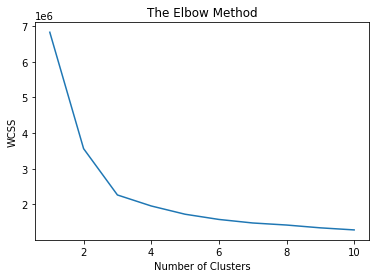

In [24]:
wcss = []
for i in range(1,11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(1,11),wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

In [25]:
clusterer = KMeans(n_clusters=6, random_state=10)
cluster_labels = clusterer.fit_predict(X)
print(cluster_labels)

[2 2 2 ... 2 2 2]


In [29]:
for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters, "The average silhouette_score is:", silhouette_avg)
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = silhouette_samples(X, cluster_labels)
        ith_cluster_silhouette_values = ith_cluster_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Print or use the silhouette scores for each cluster here
        print(f"Cluster {i} Silhouette Score: {np.mean(ith_cluster_silhouette_values)}")



For n_clusters = 2 The average silhouette_score is: 0.49068106116539695
Cluster 0 Silhouette Score: 0.5722429770929073
Cluster 1 Silhouette Score: 0.3375466963579946
For n_clusters = 3 The average silhouette_score is: 0.5415262042966191
Cluster 0 Silhouette Score: 0.5546744939601048
Cluster 1 Silhouette Score: 0.5468518457814097
Cluster 2 Silhouette Score: 0.47638766615796235
For n_clusters = 4 The average silhouette_score is: 0.5454152566838968
Cluster 0 Silhouette Score: 0.5638478551250291
Cluster 1 Silhouette Score: 0.5196742830771713
Cluster 2 Silhouette Score: 0.5337896349899511
Cluster 3 Silhouette Score: 0.2048275591825432
For n_clusters = 5 The average silhouette_score is: 0.3263243852266018
Cluster 0 Silhouette Score: 0.5229790613884269
Cluster 1 Silhouette Score: 0.27905233793589895
Cluster 2 Silhouette Score: 0.5038967859744155
Cluster 3 Silhouette Score: 0.2063991378970339
Cluster 4 Silhouette Score: 0.12179789057153172
For n_clusters = 6 The average silhouette_score is: 0.

In [32]:
print(X.shape)
print(y.shape)

(71000, 6)
(71000,)


C:\Users\Shahriar\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


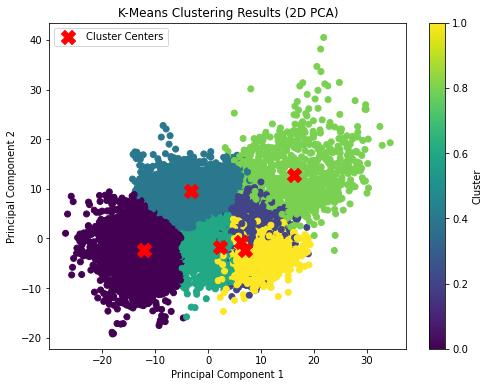

In [38]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
    
clusterer = KMeans(n_clusters=6, random_state=10)
cluster_labels = clusterer.fit_predict(X)

pca = PCA(n_components=2)
X_2d = pca.fit_transform(X)

centers = clusterer.cluster_centers_


plt.figure(figsize=(8, 6))
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=cluster_labels, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering Results (2D PCA)')

cluster_centers_2d = pca.transform(centers)
plt.scatter(cluster_centers_2d[:, 0], cluster_centers_2d[:, 1], s=200, c='red', marker='X', label='Cluster Centers')


colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

plt.colorbar(label='Cluster')
plt.legend(loc='best')
plt.show()


C:\Users\Shahriar\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


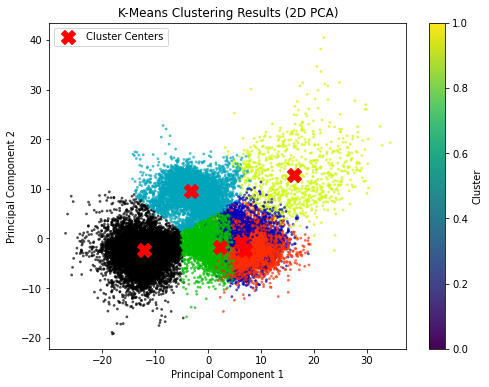

In [39]:
import matplotlib.cm as cm

clusterer = KMeans(n_clusters=6, random_state=10)
cluster_labels = clusterer.fit_predict(X)

pca = PCA(n_components=2)
X_2d = pca.fit_transform(X)

plt.figure(figsize=(8, 6))
colors = cm.nipy_spectral(cluster_labels.astype(float) / 6)
plt.scatter(X_2d[:, 0], X_2d[:, 1], c=colors, marker='.', s=30, lw=0, alpha=0.7, edgecolor='k')

cluster_centers = clusterer.cluster_centers_
cluster_centers_2d = pca.transform(cluster_centers)
plt.scatter(cluster_centers_2d[:, 0], cluster_centers_2d[:, 1], s=200, c='red', marker='X', label='Cluster Centers')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering Results (2D PCA)')

plt.colorbar(label='Cluster')
plt.legend(loc='best')
plt.show()


C:\Users\Shahriar\Anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


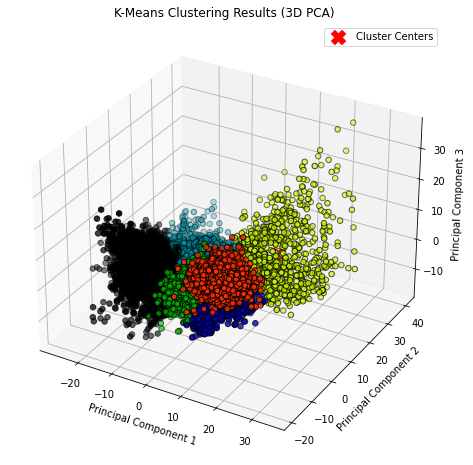

In [40]:
from mpl_toolkits.mplot3d import Axes3D 

clusterer = KMeans(n_clusters=6, random_state=10)
cluster_labels = clusterer.fit_predict(X)

pca = PCA(n_components=3)
X_3d = pca.fit_transform(X)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

colors = cm.nipy_spectral(cluster_labels.astype(float) / 6)

ax.scatter(X_3d[:, 0], X_3d[:, 1], X_3d[:, 2], c=colors, marker='o', s=30, edgecolor='k')

cluster_centers = clusterer.cluster_centers_
cluster_centers_3d = pca.transform(cluster_centers)
ax.scatter(cluster_centers_3d[:, 0], cluster_centers_3d[:, 1], cluster_centers_3d[:, 2], c='red', marker='X', s=200, label='Cluster Centers')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('K-Means Clustering Results (3D PCA)')

plt.legend(loc='best')
plt.show()


In [43]:
import plotly.express as px

# Applying K-Means clustering
clusterer = KMeans(n_clusters=3, random_state=10)
cluster_labels = clusterer.fit_predict(X)

# Applying PCA to reduce data to 3D
pca = PCA(n_components=3)
X_3d = pca.fit_transform(X)

# Creating a DataFrame with the reduced data and cluster labels
df_3d = pd.DataFrame({
    'PC1': X_3d[:, 0],
    'PC2': X_3d[:, 1],
    'PC3': X_3d[:, 2],
    'Cluster': cluster_labels
})

#interactive 3D plot
fig = px.scatter_3d(
    df_3d,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Cluster',
    size_max=8,
    opacity=0.8,
    title='K-Means Clustering Results (3D PCA)',
    labels={'Cluster': 'Cluster'}
)

fig.show()
